In [ ]:
library(CellChat)

The legacy packages maptools, rgdal, and rgeos, underpinning this package
will retire shortly. Please refer to R-spatial evolution reports on
https://r-spatial.org/r/2023/05/15/evolution4.html for details.
This package is now running under evolution status 0 

Attaching SeuratObject

Loading required package: dplyr


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: igraph


Attaching package: ‘igraph’


The following objects are masked from ‘package:dplyr’:

    as_data_frame, groups, union


The following objects are masked from ‘package:stats’:

    decompose, spectrum


The following object is masked from ‘package:base’:

    union


Loading required package: ggplot2



In [ ]:
library(Matrix)
library(reticulate)
sc <- import("scanpy")
np <- import("numpy")
sp <- import("scipy.sparse")

Registered S3 method overwritten by 'SeuratDisk':
  method            from  
  as.sparse.H5Group Seurat



In [34]:
ad_object <- sc$read_h5ad("/nfs/public/cell_gpt_data/dataHub/generated_cells/Heart_aging/merged.h5ad")

# Teen

In [48]:
data.input <- t((ad_object$uns$renormalized))
rownames(data.input) <- rownames((ad_object$var))
colnames(data.input) <- rownames((ad_object$obs))

# access meta data
meta.data <- (ad_object$obs[,c(1:3,23)])
meta <- meta.data

cell.use = rownames(meta)[meta$Age_bin == "Teen"]
data.input = data.input[, cell.use]
meta = meta[cell.use, ]

In [62]:
cellchat <- createCellChat(object = data.input, meta = meta, group.by = "cell_type")
cellchat <- setIdent(cellchat, ident.use = "cell_type") # set "labels" as default cell identity
levels(cellchat@idents) # show factor levels of the cell labels
groupSize <- as.numeric(table(cellchat@idents)) # number of cells in each cell group

CellChatDB <- CellChatDB.human
cellchat@DB <- CellChatDB #set database

cellchat <- subsetData(cellchat)

[1] "Create a CellChat object from a data matrix"
Set cell identities for the new CellChat object 
The cell groups used for CellChat analysis are  Cardiomyocyte cell Smooth muscle cell Pericyte Vascular endothelial cell Lymphatic endothelial cell Neuron Fibroblast Macrophage Monocyte T cell B cell Adipocyte 


[1] "Cardiomyocyte cell"         "Smooth muscle cell"        
 [3] "Pericyte"                   "Vascular endothelial cell" 
 [5] "Lymphatic endothelial cell" "Neuron"                    
 [7] "Fibroblast"                 "Macrophage"                
 [9] "Monocyte"                   "T cell"                    
[11] "B cell"                     "Adipocyte"

In [64]:
cellchat <- identifyOverExpressedGenes(cellchat)
cellchat <- identifyOverExpressedInteractions(cellchat)

cellchat <- computeCommunProb(cellchat,population.size = TRUE)
# Filter out the cell-cell communication if there are only few number of cells in certain cell groups
cellchat <- filterCommunication(cellchat, min.cells = 10)

# Infer the cell-cell communication at a signaling pathway level
cellchat <- computeCommunProbPathway(cellchat)
cellchat <- aggregateNet(cellchat)
cellchat <- netAnalysis_computeCentrality(cellchat, slot.name = "netP") 

triMean is used for calculating the average gene expression per cell group. 
[1] ">>> Run CellChat on sc/snRNA-seq data <<< [2024-06-24 16:39:25]"
[1] ">>> CellChat inference is done. Parameter values are stored in `object@options$parameter` <<< [2024-06-24 16:40:47]"


In [66]:
saveRDS(cellchat,"/nfs/public/chenyx/scMulan_experiment/Aging_generation_CCC/Teen.rds")

In [65]:
cellchat_teen <- cellchat

# Middle

In [67]:
data.input <- t((ad_object$uns$renormalized))
rownames(data.input) <- rownames((ad_object$var))
colnames(data.input) <- rownames((ad_object$obs))

# access meta data
meta.data <- (ad_object$obs[,c(1:3,23)])
meta <- meta.data

cell.use = rownames(meta)[meta$Age_bin == "Middle"]
data.input = data.input[, cell.use]
meta = meta[cell.use, ]

In [68]:
cellchat <- createCellChat(object = data.input, meta = meta, group.by = "cell_type")
cellchat <- setIdent(cellchat, ident.use = "cell_type") # set "labels" as default cell identity
levels(cellchat@idents) # show factor levels of the cell labels
groupSize <- as.numeric(table(cellchat@idents)) # number of cells in each cell group

CellChatDB <- CellChatDB.human
cellchat@DB <- CellChatDB #set database

cellchat <- subsetData(cellchat)

[1] "Create a CellChat object from a data matrix"
Set cell identities for the new CellChat object 
The cell groups used for CellChat analysis are  Cardiomyocyte cell Smooth muscle cell Pericyte Vascular endothelial cell Lymphatic endothelial cell Neuron Fibroblast Macrophage Monocyte T cell B cell Adipocyte 


[1] "Cardiomyocyte cell"         "Smooth muscle cell"        
 [3] "Pericyte"                   "Vascular endothelial cell" 
 [5] "Lymphatic endothelial cell" "Neuron"                    
 [7] "Fibroblast"                 "Macrophage"                
 [9] "Monocyte"                   "T cell"                    
[11] "B cell"                     "Adipocyte"

In [69]:
cellchat <- identifyOverExpressedGenes(cellchat)
cellchat <- identifyOverExpressedInteractions(cellchat)

cellchat <- computeCommunProb(cellchat,population.size = TRUE)
# Filter out the cell-cell communication if there are only few number of cells in certain cell groups
cellchat <- filterCommunication(cellchat, min.cells = 10)

# Infer the cell-cell communication at a signaling pathway level
cellchat <- computeCommunProbPathway(cellchat)
cellchat <- aggregateNet(cellchat)
cellchat <- netAnalysis_computeCentrality(cellchat, slot.name = "netP") 

triMean is used for calculating the average gene expression per cell group. 
[1] ">>> Run CellChat on sc/snRNA-seq data <<< [2024-06-24 16:42:48]"
[1] ">>> CellChat inference is done. Parameter values are stored in `object@options$parameter` <<< [2024-06-24 16:44:09]"


In [70]:
saveRDS(cellchat,"/nfs/public/chenyx/scMulan_experiment/Aging_generation_CCC/Middle.rds")

In [71]:
cellchat_mid <- cellchat

# old

In [72]:
data.input <- t((ad_object$uns$renormalized))
rownames(data.input) <- rownames((ad_object$var))
colnames(data.input) <- rownames((ad_object$obs))

# access meta data
meta.data <- (ad_object$obs[,c(1:3,23)])
meta <- meta.data

cell.use = rownames(meta)[meta$Age_bin == "old"]
data.input = data.input[, cell.use]
meta = meta[cell.use, ]

In [73]:
cellchat <- createCellChat(object = data.input, meta = meta, group.by = "cell_type")
cellchat <- setIdent(cellchat, ident.use = "cell_type") # set "labels" as default cell identity
levels(cellchat@idents) # show factor levels of the cell labels
groupSize <- as.numeric(table(cellchat@idents)) # number of cells in each cell group

CellChatDB <- CellChatDB.human
cellchat@DB <- CellChatDB #set database

cellchat <- subsetData(cellchat)

[1] "Create a CellChat object from a data matrix"
Set cell identities for the new CellChat object 
The cell groups used for CellChat analysis are  Cardiomyocyte cell Smooth muscle cell Pericyte Vascular endothelial cell Lymphatic endothelial cell Neuron Fibroblast Macrophage Monocyte T cell B cell Adipocyte 


[1] "Cardiomyocyte cell"         "Smooth muscle cell"        
 [3] "Pericyte"                   "Vascular endothelial cell" 
 [5] "Lymphatic endothelial cell" "Neuron"                    
 [7] "Fibroblast"                 "Macrophage"                
 [9] "Monocyte"                   "T cell"                    
[11] "B cell"                     "Adipocyte"

In [74]:
cellchat <- identifyOverExpressedGenes(cellchat)
cellchat <- identifyOverExpressedInteractions(cellchat)

cellchat <- computeCommunProb(cellchat,population.size = TRUE)
# Filter out the cell-cell communication if there are only few number of cells in certain cell groups
cellchat <- filterCommunication(cellchat, min.cells = 10)

# Infer the cell-cell communication at a signaling pathway level
cellchat <- computeCommunProbPathway(cellchat)
cellchat <- aggregateNet(cellchat)
cellchat <- netAnalysis_computeCentrality(cellchat, slot.name = "netP") 

triMean is used for calculating the average gene expression per cell group. 
[1] ">>> Run CellChat on sc/snRNA-seq data <<< [2024-06-24 16:44:13]"
[1] ">>> CellChat inference is done. Parameter values are stored in `object@options$parameter` <<< [2024-06-24 16:45:42]"


In [75]:
saveRDS(cellchat,"/nfs/public/chenyx/scMulan_experiment/Aging_generation_CCC/old.rds")

In [76]:
cellchat_old <- cellchat

In [3]:
cellchat_teen <- readRDS("/nfs/public/chenyx/scMulan_experiment/Aging_generation_CCC/Teen.rds")
cellchat_mid <- readRDS("/nfs/public/chenyx/scMulan_experiment/Aging_generation_CCC/Middle.rds")
cellchat_old <- readRDS("/nfs/public/chenyx/scMulan_experiment/Aging_generation_CCC/old.rds")

# Comparison between ages

In [4]:
object.list <- c(cellchat_teen, cellchat_mid, cellchat_old)

In [5]:
cellchat <- mergeCellChat(object.list, add.names = c('teen', 'mid','aged'))
cellchat

Merge the following slots: 'data.signaling','images','net', 'netP','meta', 'idents', 'var.features' , 'DB', and 'LR'.



An object of class CellChat created from a merged object with multiple datasets 
 437 signaling genes.
 31200 cells. 
CellChat analysis of single cell RNA-seq data! 

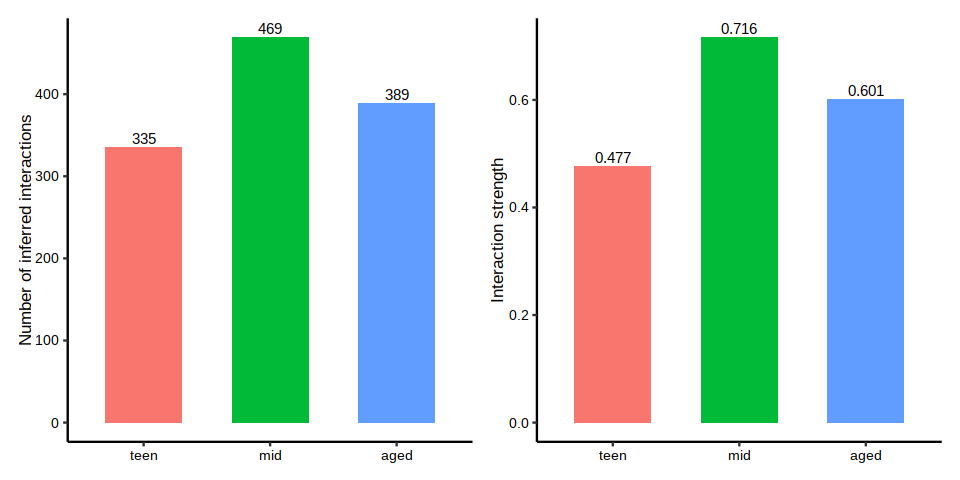

In [81]:
options(repr.plot.width=8,repr.plot.height=4)
gg1 <- compareInteractions(cellchat, show.legend = F, group = c(1,2,3))
gg2 <- compareInteractions(cellchat, show.legend = F, group = c(1,2,3), measure = "weight")
gg1 + gg2

Signaling role analysis on the aggregated cell-cell communication network from all signaling pathways

Signaling role analysis on the aggregated cell-cell communication network from all signaling pathways

Signaling role analysis on the aggregated cell-cell communication network from all signaling pathways



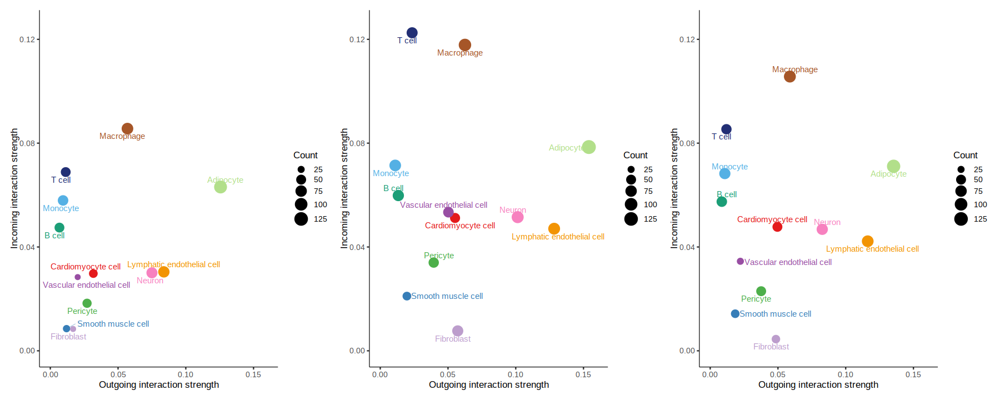

In [94]:
options(repr.plot.width=15,repr.plot.height=6)

num.link <- sapply(object.list, function(x) {rowSums(x@net$count) + colSums(x@net$count)-diag(x@net$count)})
weight.MinMax <- c(min(num.link), max(num.link)) # control the dot size in the different datasets
gg <- list()
for (i in 1:length(object.list)) {
  gg[[i]] <- netAnalysis_signalingRole_scatter(object.list[[i]], title = names(object.list)[i], weight.MinMax = weight.MinMax) + 
   xlim(0,0.16) + 
   ylim(0,0.125)
}
patchwork::wrap_plots(plots = gg)

## teen vs mid

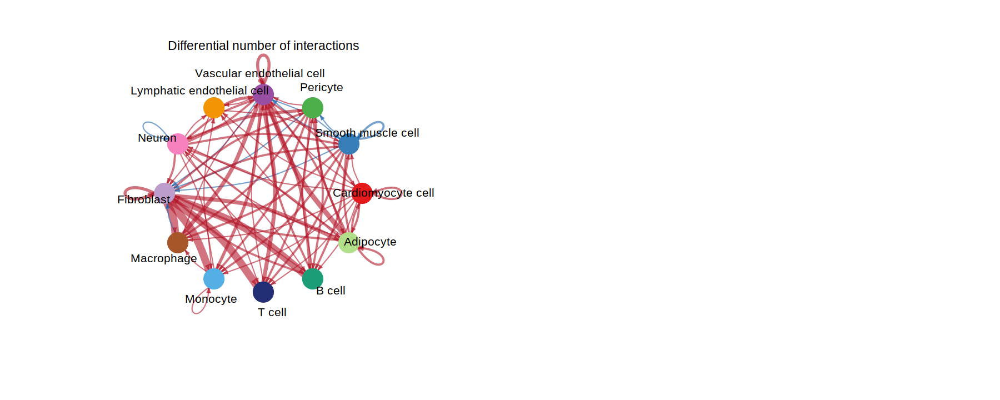

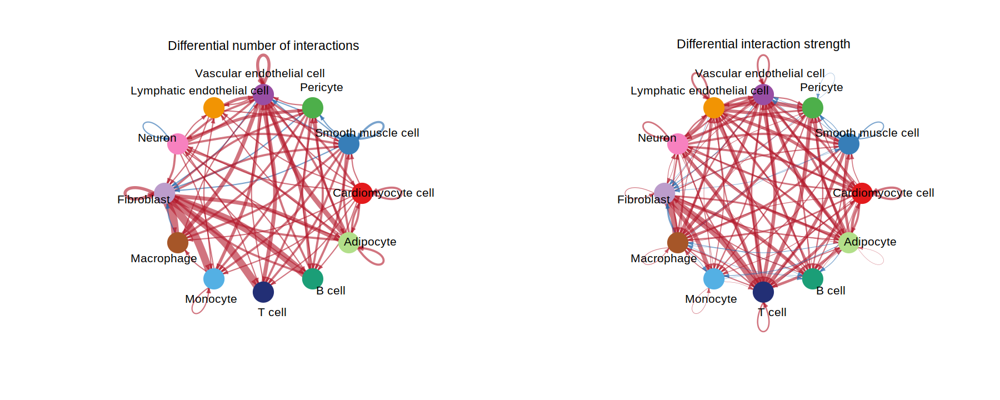

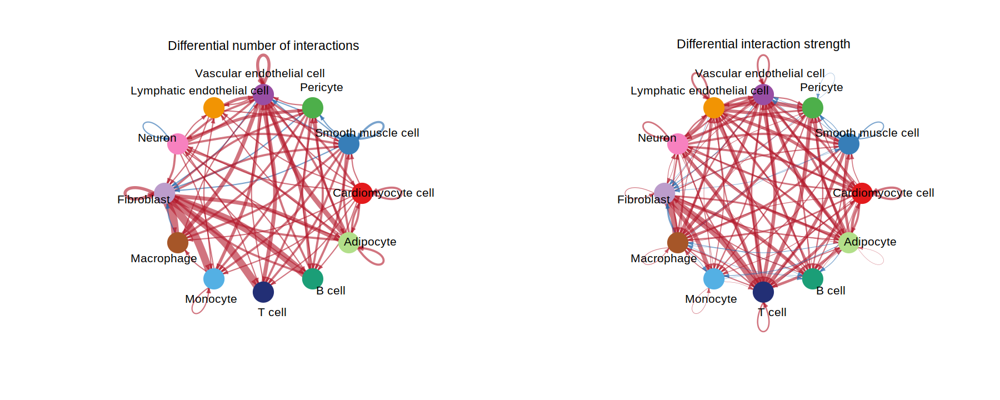

In [99]:
options(repr.plot.width=15,repr.plot.height=6)

par(mfrow = c(1,2), xpd=TRUE)
netVisual_diffInteraction(cellchat, weight.scale = T, comparison = c(1,2))
netVisual_diffInteraction(cellchat, weight.scale = T, comparison = c(1,2), measure = "weight")

Do heatmap based on a merged object 




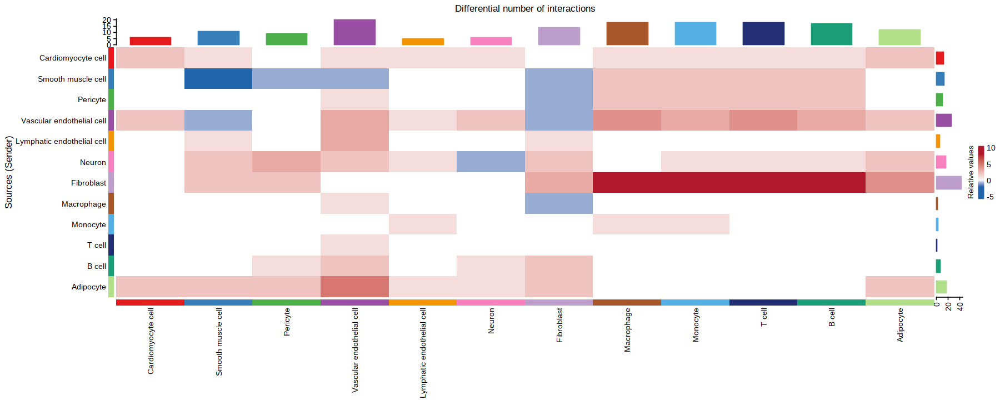

In [97]:
netVisual_heatmap(cellchat, comparison = c(1,2))

Do heatmap based on a merged object 




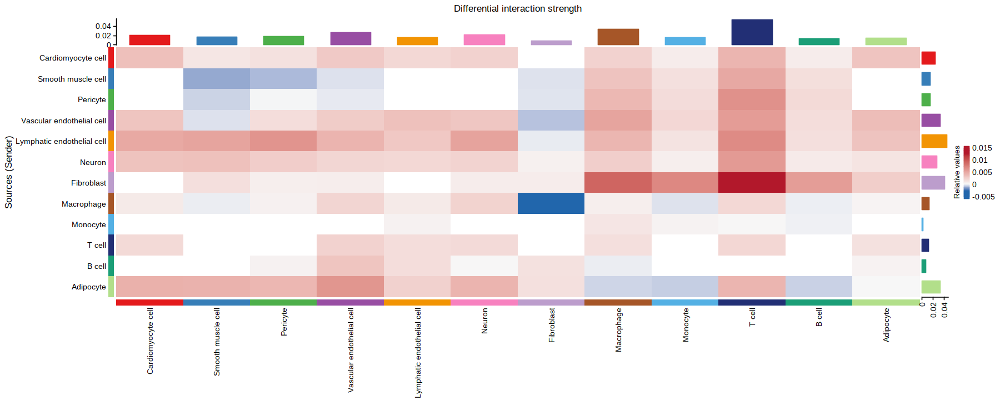

In [98]:
netVisual_heatmap(cellchat, comparison = c(1,2), measure = "weight")

In [12]:
pdf("figures/CC_MidVSTeen.pdf", width = 15, height = 6)

options(repr.plot.width=15,repr.plot.height=6)
netVisual_heatmap(cellchat, comparison = c(1,2), measure = "weight")
dev.off()

Do heatmap based on a merged object 




png 
  2

Visualizing differential outgoing and incoming signaling changes from teen to mid

Visualizing differential outgoing and incoming signaling changes from teen to mid



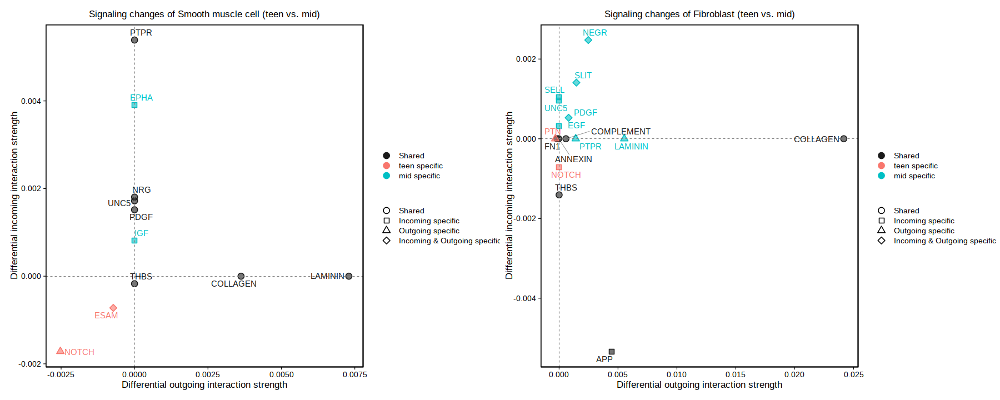

In [100]:
gg1 <- netAnalysis_signalingChanges_scatter(cellchat, idents.use = "Smooth muscle cell")
gg2 <- netAnalysis_signalingChanges_scatter(cellchat, idents.use = "Fibroblast")
patchwork::wrap_plots(plots = list(gg1,gg2))

Visualizing differential outgoing and incoming signaling changes from teen to mid

The following `from` values were not present in `x`: -1, 1, 2

The following `from` values were not present in `x`: -1, 1

Visualizing differential outgoing and incoming signaling changes from teen to mid

The following `from` values were not present in `x`: -1, 1, 2

The following `from` values were not present in `x`: -1, 1



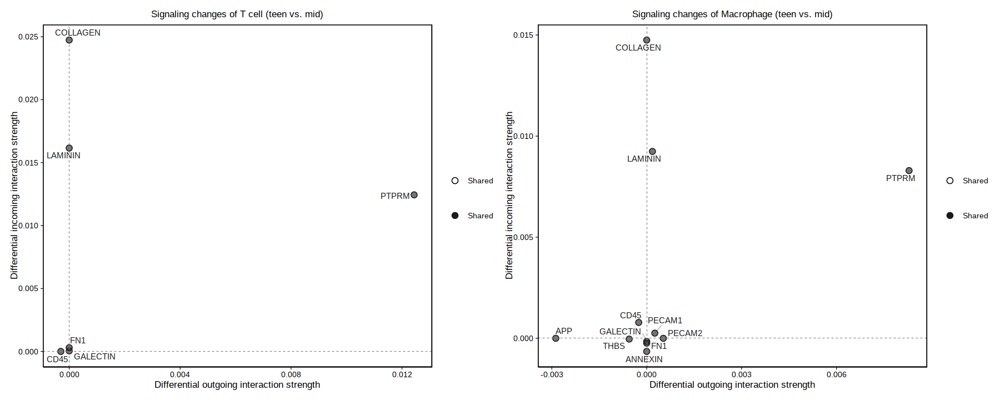

In [101]:
gg1 <- netAnalysis_signalingChanges_scatter(cellchat, idents.use = "T cell")
gg2 <- netAnalysis_signalingChanges_scatter(cellchat, idents.use = "Macrophage")
patchwork::wrap_plots(plots = list(gg1,gg2))

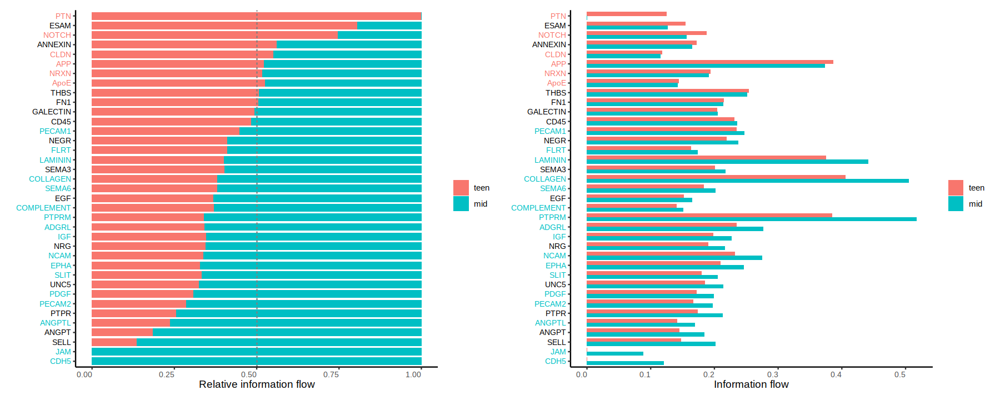

In [102]:
gg1 <- rankNet(cellchat, mode = "comparison", comparison = c(1,2), stacked = T, do.stat = TRUE)
gg2 <- rankNet(cellchat, mode = "comparison", comparison = c(1,2), stacked = F, do.stat = TRUE)
gg1 + gg2

In [103]:
sort(unique(cellchat@idents$aged))

[1] Cardiomyocyte cell         Smooth muscle cell        
 [3] Pericyte                   Vascular endothelial cell 
 [5] Lymphatic endothelial cell Neuron                    
 [7] Fibroblast                 Macrophage                
 [9] Monocyte                   T cell                    
[11] B cell                     Adipocyte                 
12 Levels: Cardiomyocyte cell Smooth muscle cell ... Adipocyte

Comparing communications on a merged object 


Comparing communications on a merged object 




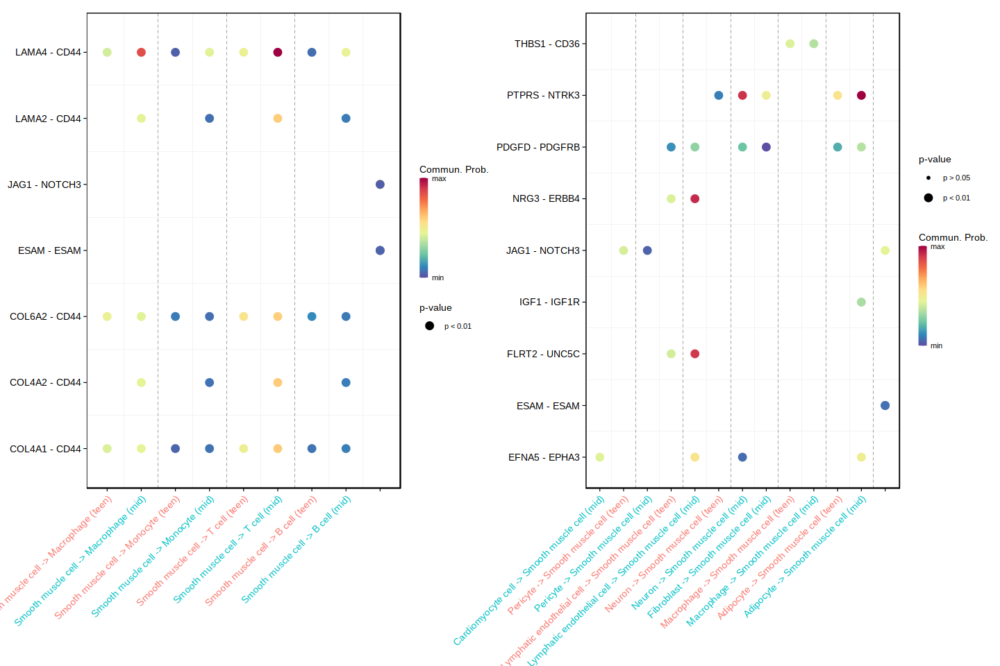

In [110]:
# SMC
options(repr.plot.width=12,repr.plot.height=8)
gg1 <- netVisual_bubble(cellchat, sources.use = c(2),   comparison = c(1, 2), angle.x = 45)
gg2 <- netVisual_bubble(cellchat, targets.use = c(2),   comparison = c(1, 2), angle.x = 45)
patchwork::wrap_plots(plots = list(gg1,gg2))

Comparing communications on a merged object 


Comparing communications on a merged object 




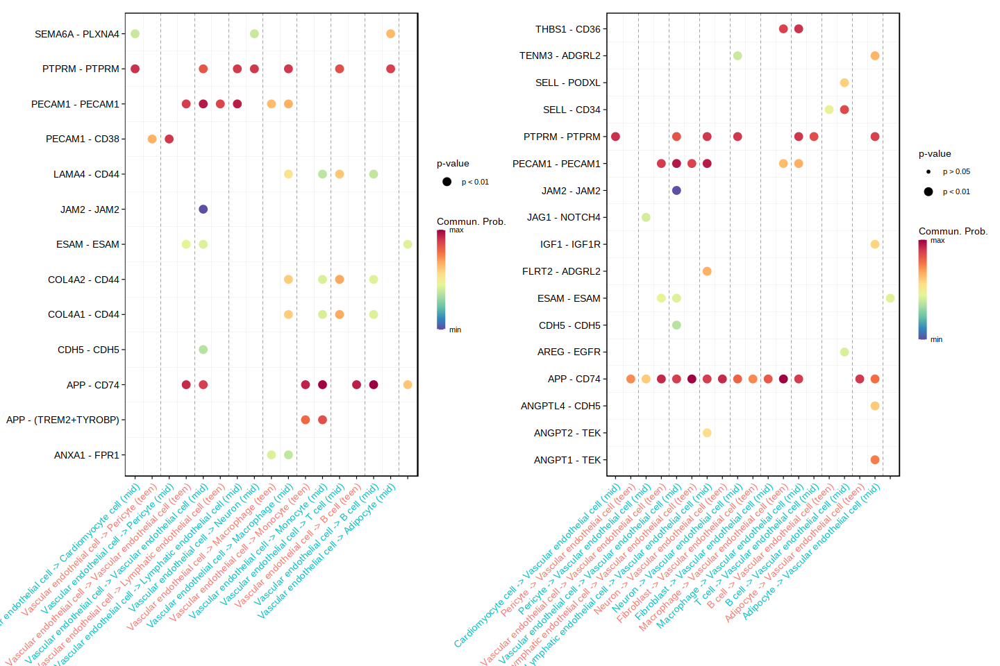

In [111]:
# vEC
options(repr.plot.width=12,repr.plot.height=8)
gg1 <- netVisual_bubble(cellchat, sources.use = c(4),   comparison = c(1, 2), angle.x = 45)
gg2 <- netVisual_bubble(cellchat, targets.use = c(4),   comparison = c(1, 2), angle.x = 45)
patchwork::wrap_plots(plots = list(gg1,gg2))

Comparing communications on a merged object 


Comparing communications on a merged object 




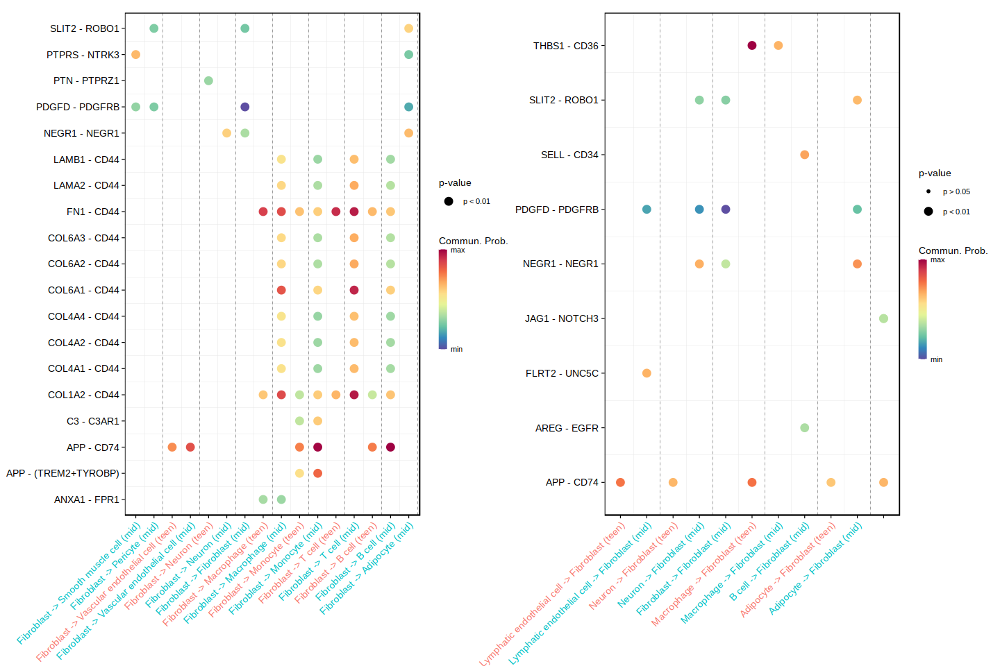

In [112]:
# FB
options(repr.plot.width=12,repr.plot.height=8)
gg1 <- netVisual_bubble(cellchat, sources.use = c(7),   comparison = c(1, 2), angle.x = 45)
gg2 <- netVisual_bubble(cellchat, targets.use = c(7),   comparison = c(1, 2), angle.x = 45)
patchwork::wrap_plots(plots = list(gg1,gg2))

Comparing communications on a merged object 


Comparing communications on a merged object 




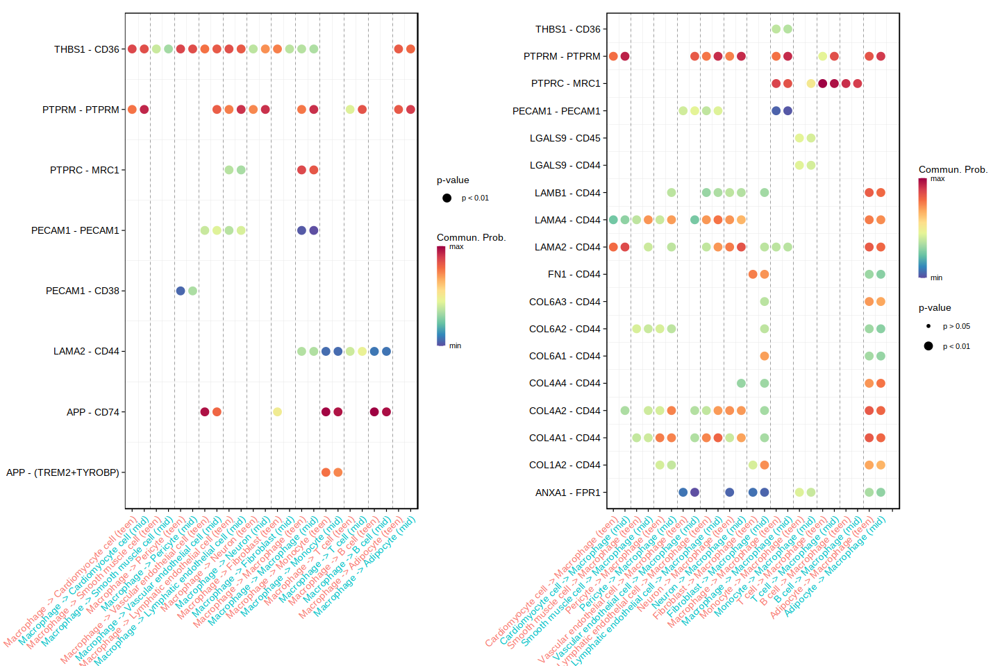

In [113]:
# MP
options(repr.plot.width=12,repr.plot.height=8)
gg1 <- netVisual_bubble(cellchat, sources.use = c(8),   comparison = c(1, 2), angle.x = 45)
gg2 <- netVisual_bubble(cellchat, targets.use = c(8),   comparison = c(1, 2), angle.x = 45)
patchwork::wrap_plots(plots = list(gg1,gg2))

Comparing communications on a merged object 


Comparing communications on a merged object 




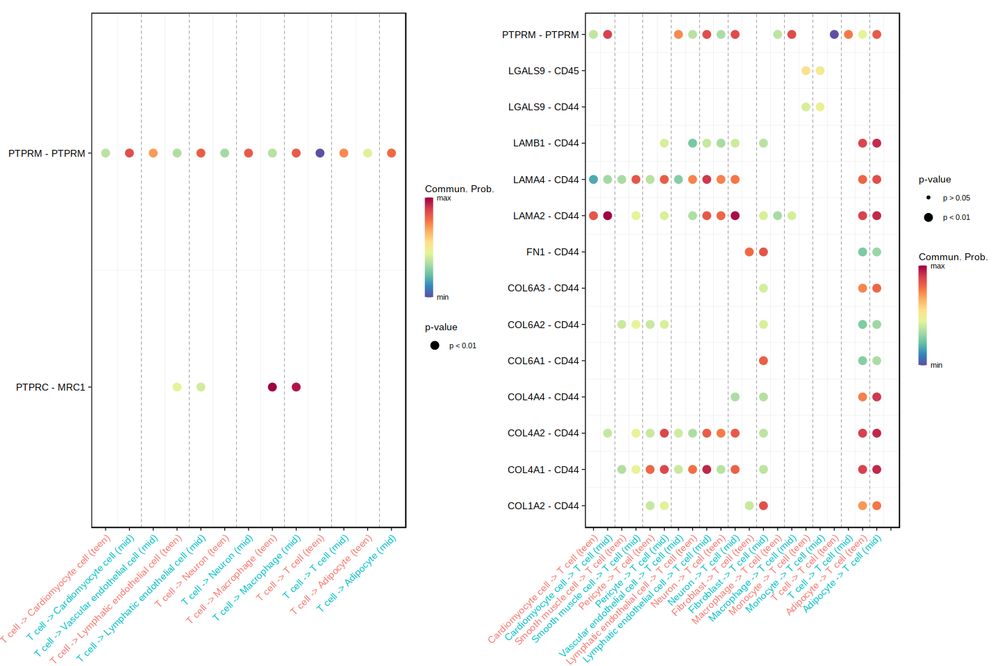

In [ ]:
# T
options(repr.plot.width=12,repr.plot.height=8)
gg1 <- netVisual_bubble(cellchat, sources.use = c(10),   comparison = c(1, 2), angle.x = 45)
gg2 <- netVisual_bubble(cellchat, targets.use = c(10),   comparison = c(1, 2), angle.x = 45)
patchwork::wrap_plots(plots = list(gg1,gg2))

## teen vs aged

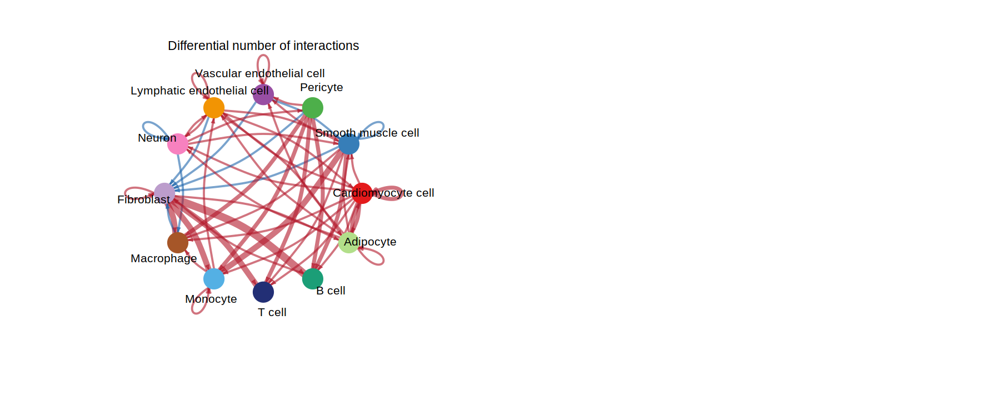

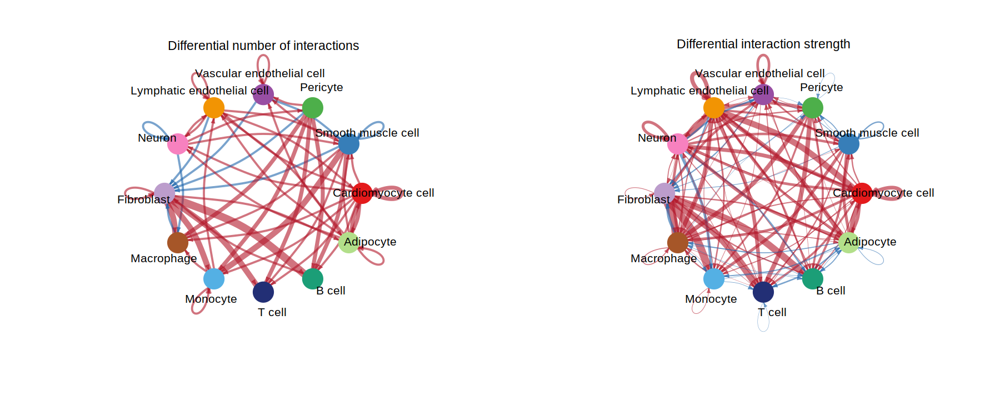

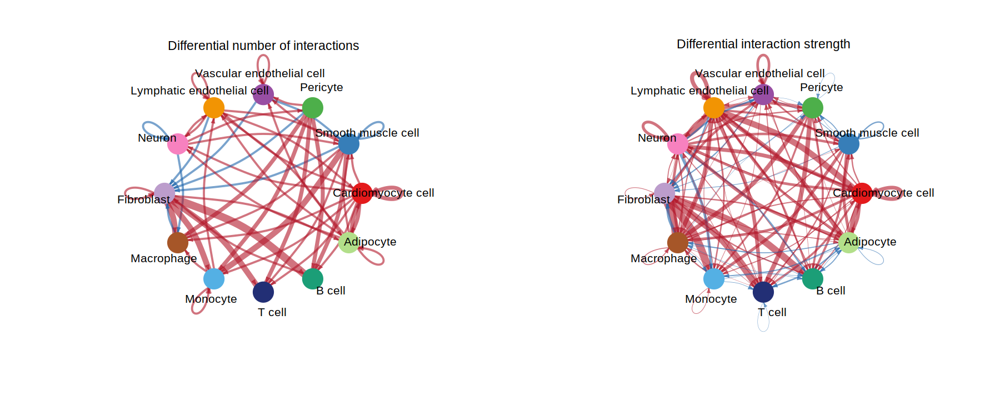

In [115]:
options(repr.plot.width=15,repr.plot.height=6)

par(mfrow = c(1,2), xpd=TRUE)
netVisual_diffInteraction(cellchat, weight.scale = T, comparison = c(1,3))
netVisual_diffInteraction(cellchat, weight.scale = T, comparison = c(1,3), measure = "weight")

Do heatmap based on a merged object 




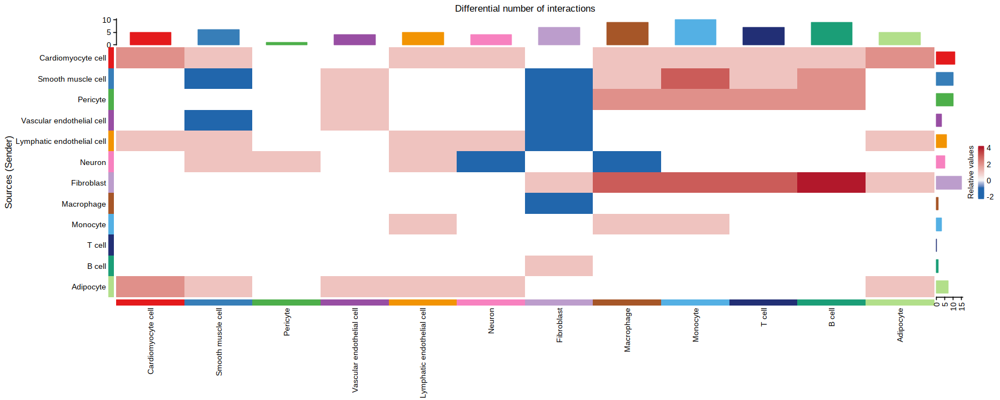

In [116]:
netVisual_heatmap(cellchat, comparison = c(1,3))

Do heatmap based on a merged object 




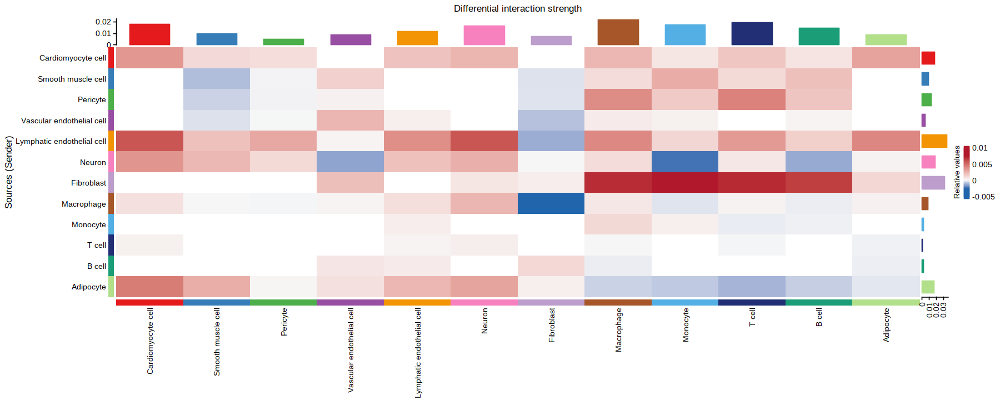

In [117]:
netVisual_heatmap(cellchat, comparison = c(1,3), measure = "weight")

Visualizing differential outgoing and incoming signaling changes from teen to aged

Visualizing differential outgoing and incoming signaling changes from teen to aged



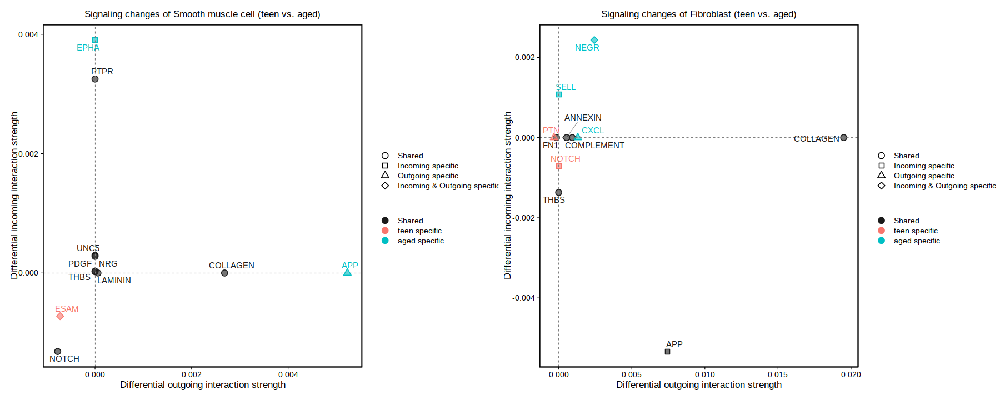

In [120]:
gg1 <- netAnalysis_signalingChanges_scatter(cellchat, idents.use = "Smooth muscle cell",comparison = c(1,3))
gg2 <- netAnalysis_signalingChanges_scatter(cellchat, idents.use = "Fibroblast",comparison = c(1,3))
patchwork::wrap_plots(plots = list(gg1,gg2))

Visualizing differential outgoing and incoming signaling changes from teen to aged

The following `from` values were not present in `x`: -1, 1, 2

The following `from` values were not present in `x`: -1, 1

Visualizing differential outgoing and incoming signaling changes from teen to aged

The following `from` values were not present in `x`: -1, 1, 2

The following `from` values were not present in `x`: -1, 1



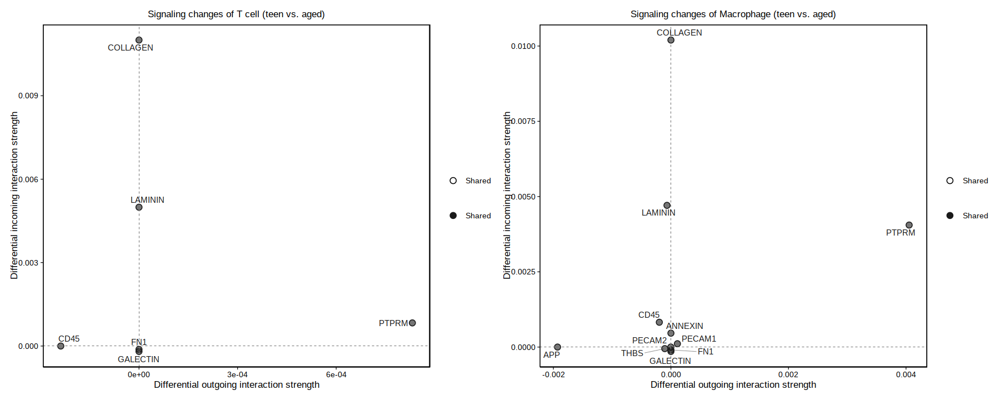

In [122]:
gg1 <- netAnalysis_signalingChanges_scatter(cellchat, idents.use = "T cell",comparison = c(1,3))
gg2 <- netAnalysis_signalingChanges_scatter(cellchat, idents.use = "Macrophage",comparison = c(1,3))
patchwork::wrap_plots(plots = list(gg1,gg2))

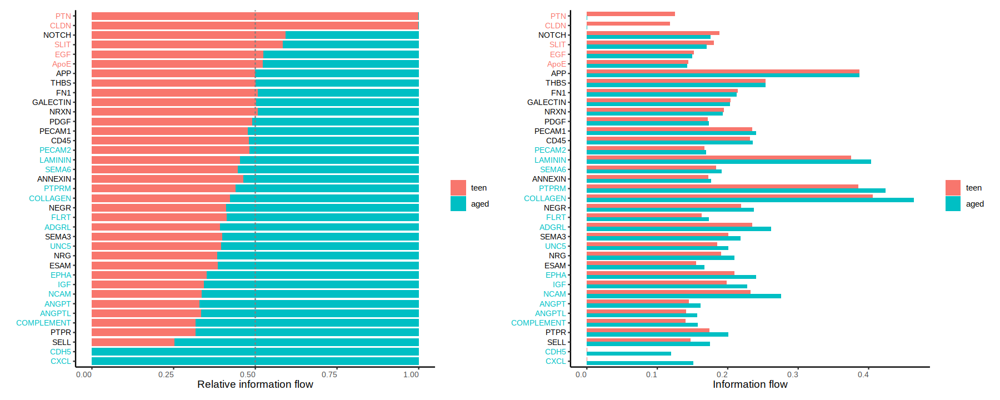

In [123]:
gg1 <- rankNet(cellchat, mode = "comparison",comparison = c(1,3), stacked = T, do.stat = TRUE)
gg2 <- rankNet(cellchat, mode = "comparison",comparison = c(1,3), stacked = F, do.stat = TRUE)
gg1 + gg2

In [103]:
sort(unique(cellchat@idents$aged))

[1] Cardiomyocyte cell         Smooth muscle cell        
 [3] Pericyte                   Vascular endothelial cell 
 [5] Lymphatic endothelial cell Neuron                    
 [7] Fibroblast                 Macrophage                
 [9] Monocyte                   T cell                    
[11] B cell                     Adipocyte                 
12 Levels: Cardiomyocyte cell Smooth muscle cell ... Adipocyte

Comparing communications on a merged object 


Comparing communications on a merged object 




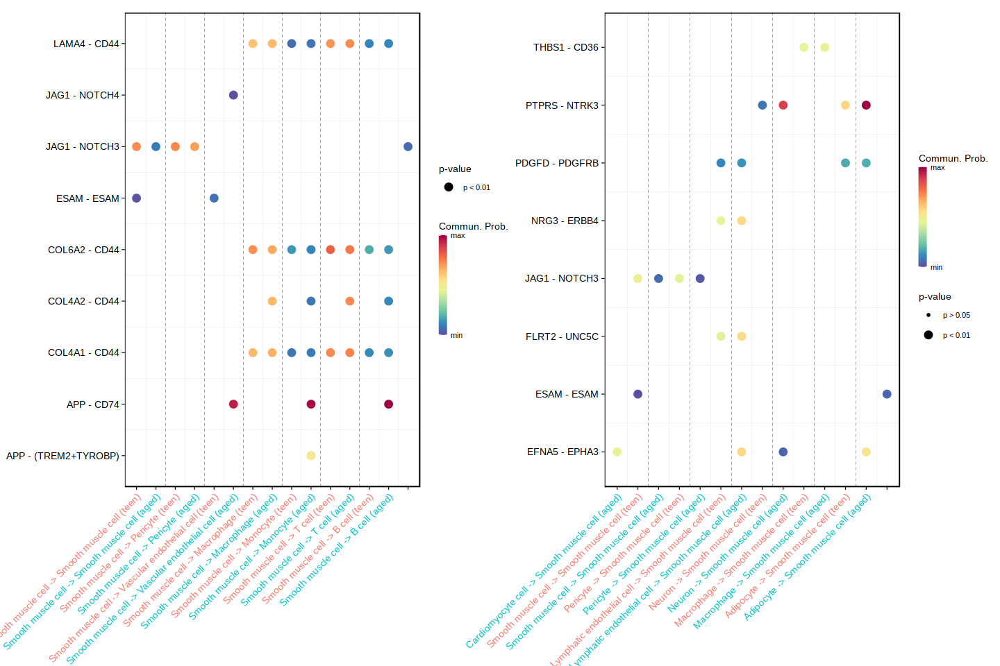

In [124]:
# SMC
options(repr.plot.width=12,repr.plot.height=8)
gg1 <- netVisual_bubble(cellchat, sources.use = c(2), comparison = c(1,3), angle.x = 45)
gg2 <- netVisual_bubble(cellchat, targets.use = c(2), comparison = c(1,3), angle.x = 45)
patchwork::wrap_plots(plots = list(gg1,gg2))

Comparing communications on a merged object 


Comparing communications on a merged object 




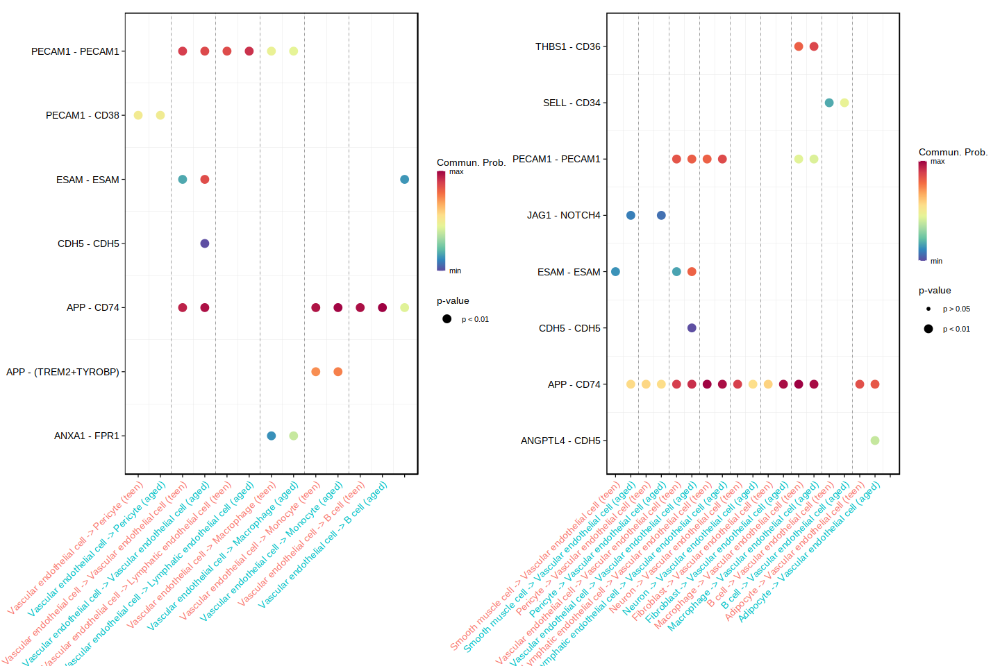

In [125]:
# vEC
options(repr.plot.width=12,repr.plot.height=8)
gg1 <- netVisual_bubble(cellchat, sources.use = c(4), comparison = c(1,3), angle.x = 45)
gg2 <- netVisual_bubble(cellchat, targets.use = c(4), comparison = c(1,3), angle.x = 45)
patchwork::wrap_plots(plots = list(gg1,gg2))

Comparing communications on a merged object 


Comparing communications on a merged object 




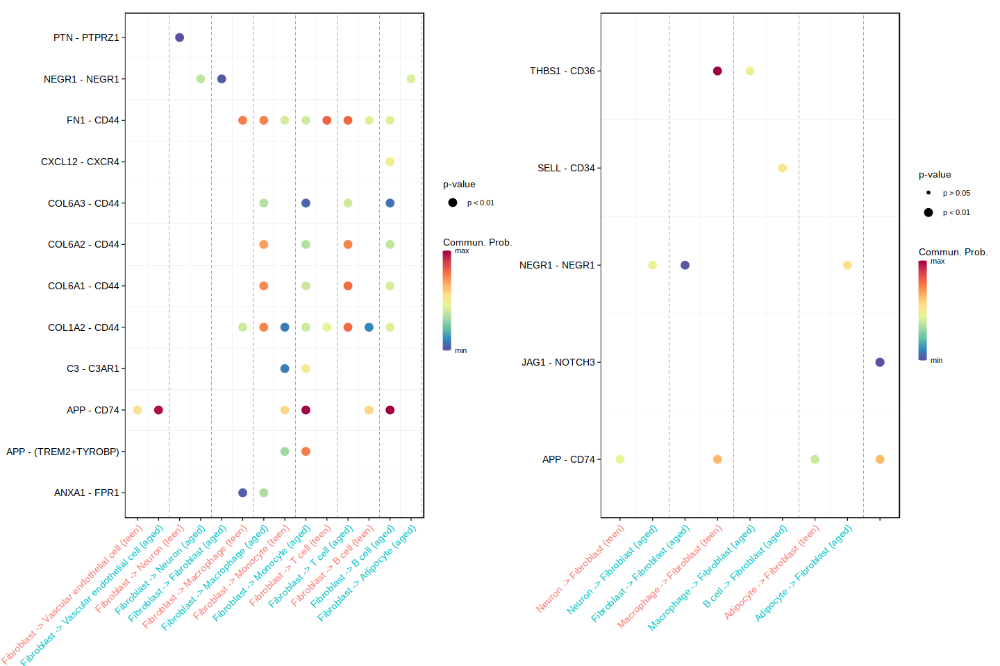

In [126]:
# FB
options(repr.plot.width=12,repr.plot.height=8)
gg1 <- netVisual_bubble(cellchat, sources.use = c(7), comparison = c(1,3), angle.x = 45)
gg2 <- netVisual_bubble(cellchat, targets.use = c(7), comparison = c(1,3), angle.x = 45)
patchwork::wrap_plots(plots = list(gg1,gg2))

Comparing communications on a merged object 


Comparing communications on a merged object 




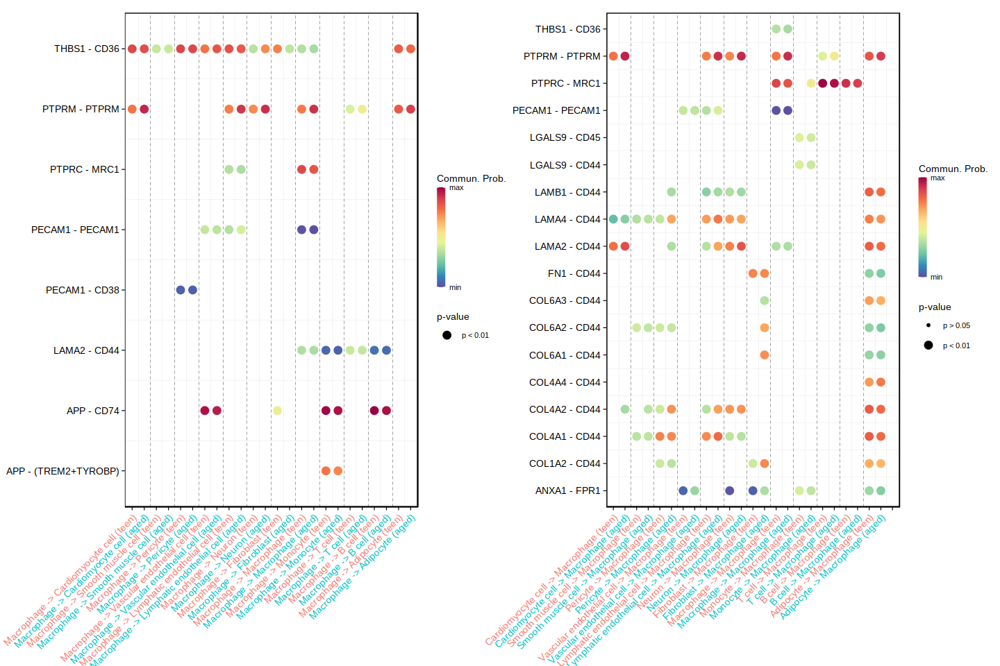

In [127]:
# MP
options(repr.plot.width=12,repr.plot.height=8)
gg1 <- netVisual_bubble(cellchat, sources.use = c(8), comparison = c(1,3), angle.x = 45)
gg2 <- netVisual_bubble(cellchat, targets.use = c(8), comparison = c(1,3), angle.x = 45)
patchwork::wrap_plots(plots = list(gg1,gg2))

Comparing communications on a merged object 


Comparing communications on a merged object 




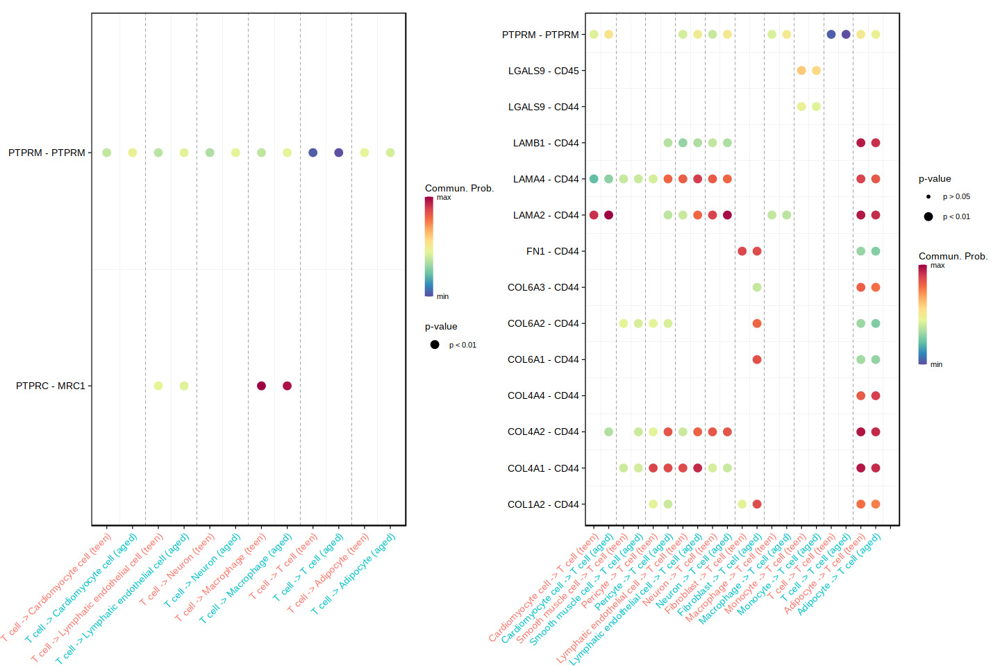

In [128]:
# T
options(repr.plot.width=12,repr.plot.height=8)
gg1 <- netVisual_bubble(cellchat, sources.use = c(10), comparison = c(1,3), angle.x = 45)
gg2 <- netVisual_bubble(cellchat, targets.use = c(10), comparison = c(1,3), angle.x = 45)
patchwork::wrap_plots(plots = list(gg1,gg2))

## mid vs aged

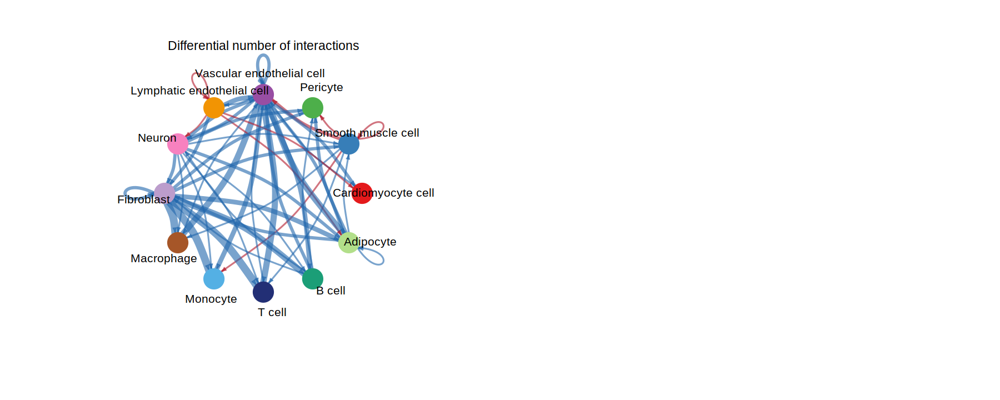

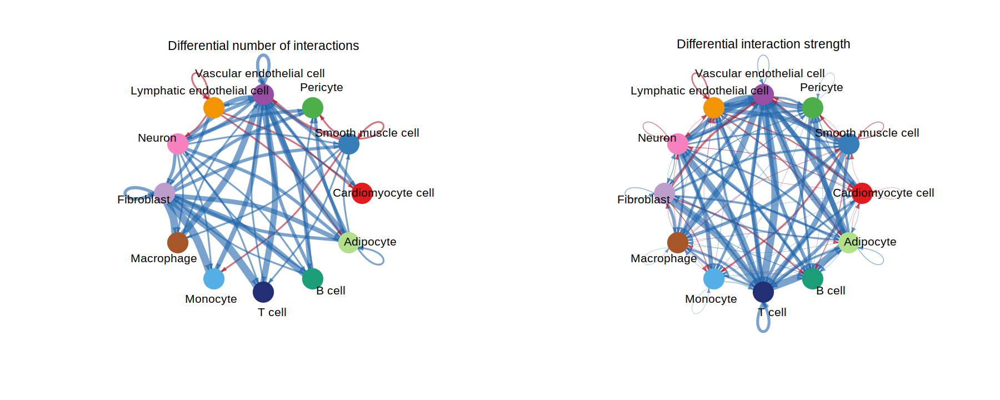

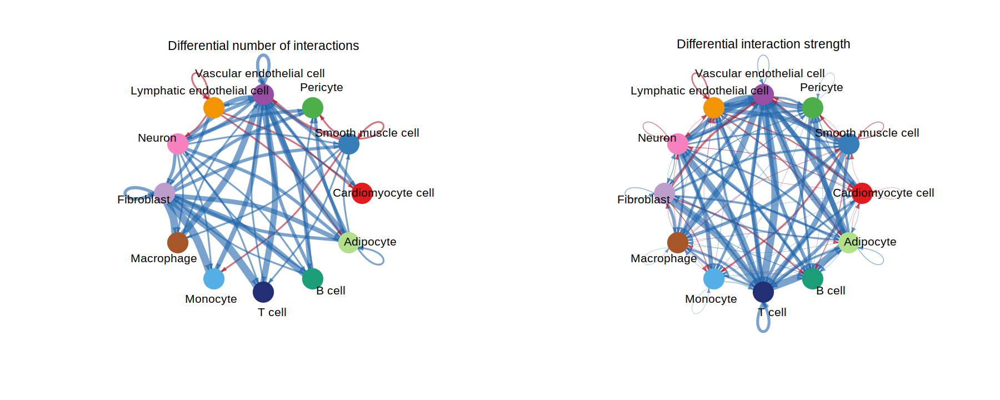

In [129]:
options(repr.plot.width=15,repr.plot.height=6)

par(mfrow = c(1,2), xpd=TRUE)
netVisual_diffInteraction(cellchat, weight.scale = T, comparison = c(2,3))
netVisual_diffInteraction(cellchat, weight.scale = T, comparison = c(2,3), measure = "weight")

Do heatmap based on a merged object 




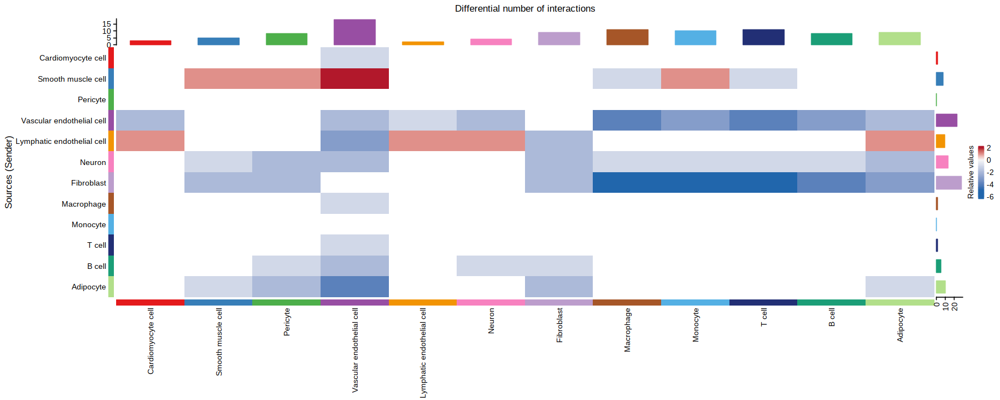

In [132]:
netVisual_heatmap(cellchat, comparison = c(2,3))

Do heatmap based on a merged object 




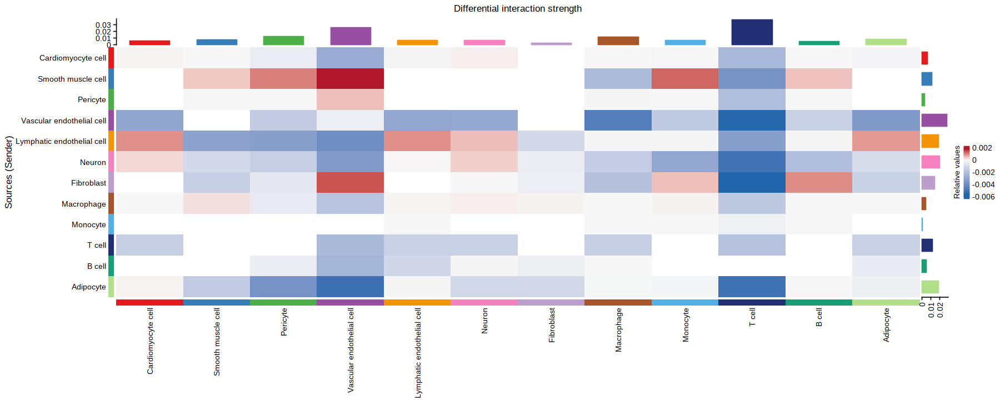

In [133]:
netVisual_heatmap(cellchat, comparison = c(2,3), measure = "weight")

Visualizing differential outgoing and incoming signaling changes from mid to aged

The following `from` values were not present in `x`: 2

Visualizing differential outgoing and incoming signaling changes from mid to aged



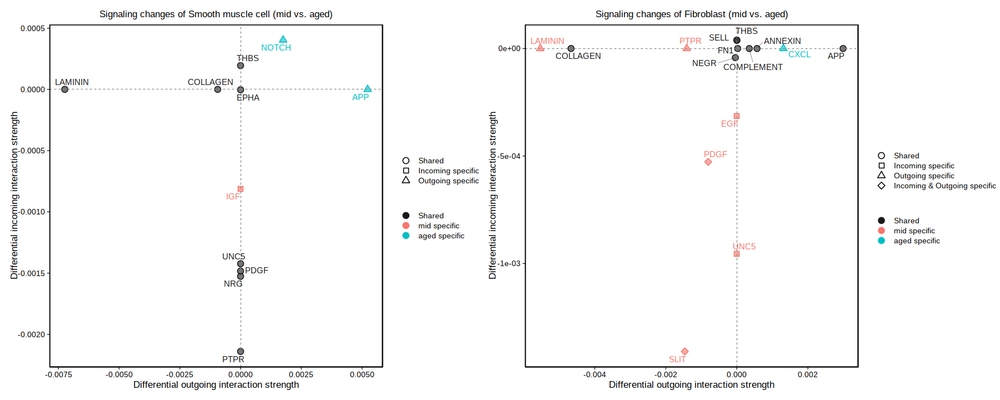

In [134]:
gg1 <- netAnalysis_signalingChanges_scatter(cellchat, idents.use = "Smooth muscle cell",comparison = c(2,3))
gg2 <- netAnalysis_signalingChanges_scatter(cellchat, idents.use = "Fibroblast",comparison = c(2,3))
patchwork::wrap_plots(plots = list(gg1,gg2))

Visualizing differential outgoing and incoming signaling changes from mid to aged

The following `from` values were not present in `x`: -1, 1, 2

The following `from` values were not present in `x`: -1, 1

Visualizing differential outgoing and incoming signaling changes from mid to aged

The following `from` values were not present in `x`: -1, 1, 2

The following `from` values were not present in `x`: -1, 1



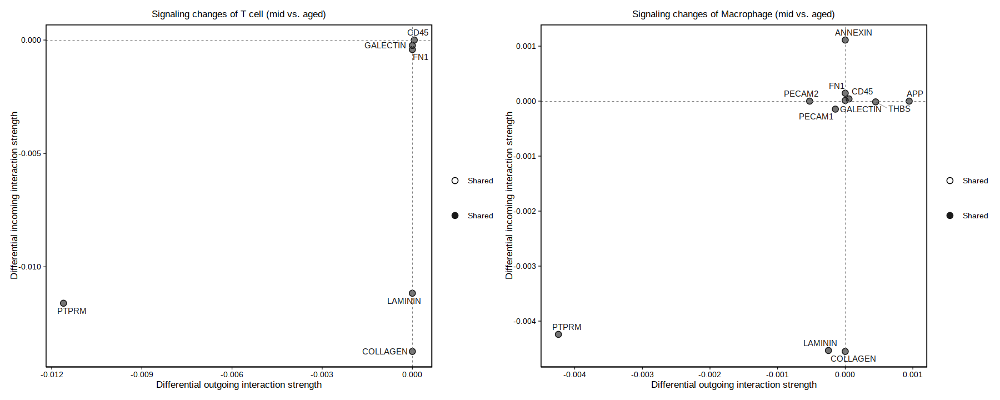

In [135]:
gg1 <- netAnalysis_signalingChanges_scatter(cellchat, idents.use = "T cell",comparison = c(2,3))
gg2 <- netAnalysis_signalingChanges_scatter(cellchat, idents.use = "Macrophage",comparison = c(2,3))
patchwork::wrap_plots(plots = list(gg1,gg2))

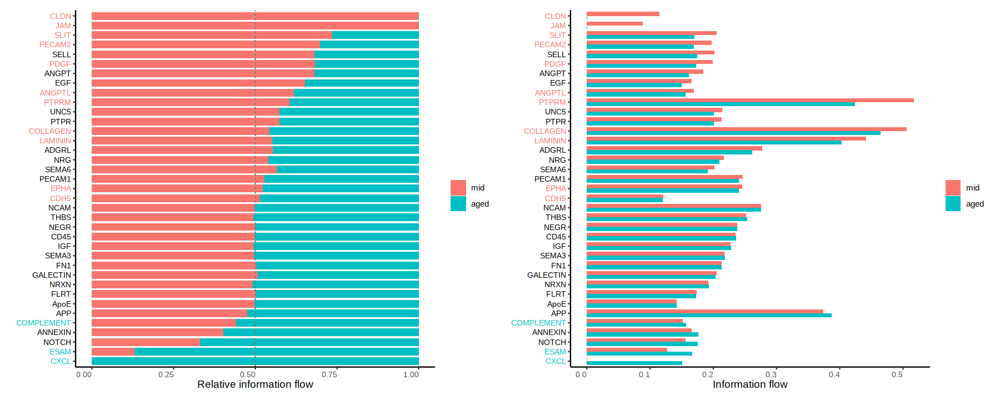

In [136]:
gg1 <- rankNet(cellchat, mode = "comparison",comparison = c(2,3), stacked = T, do.stat = TRUE)
gg2 <- rankNet(cellchat, mode = "comparison",comparison = c(2,3), stacked = F, do.stat = TRUE)
gg1 + gg2

In [103]:
sort(unique(cellchat@idents$aged))

[1] Cardiomyocyte cell         Smooth muscle cell        
 [3] Pericyte                   Vascular endothelial cell 
 [5] Lymphatic endothelial cell Neuron                    
 [7] Fibroblast                 Macrophage                
 [9] Monocyte                   T cell                    
[11] B cell                     Adipocyte                 
12 Levels: Cardiomyocyte cell Smooth muscle cell ... Adipocyte

Comparing communications on a merged object 


Comparing communications on a merged object 




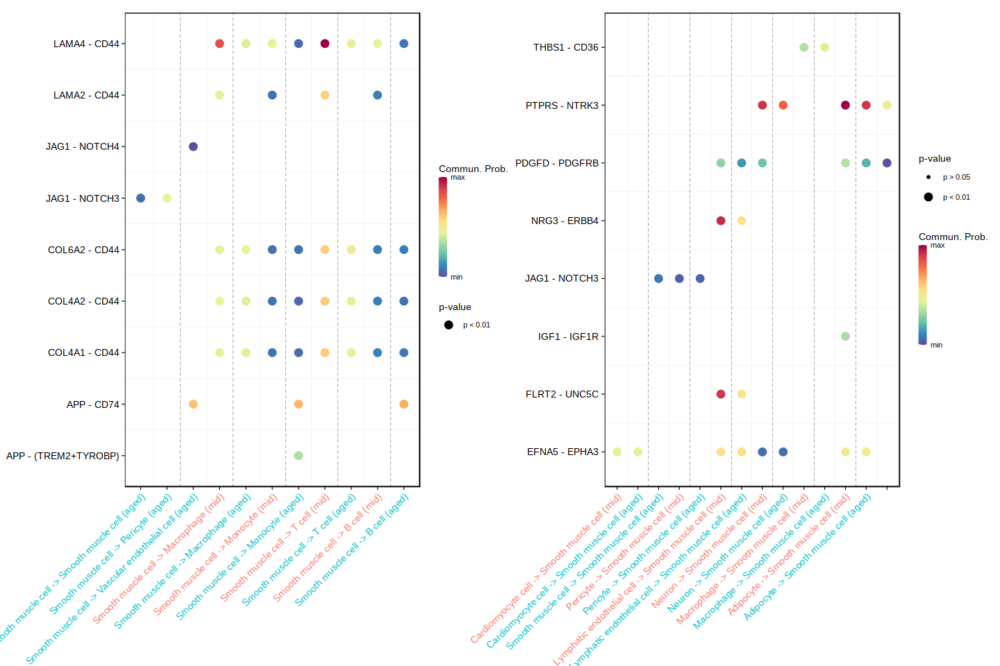

In [137]:
# SMC
options(repr.plot.width=12,repr.plot.height=8)
gg1 <- netVisual_bubble(cellchat, sources.use = c(2), comparison = c(2,3), angle.x = 45)
gg2 <- netVisual_bubble(cellchat, targets.use = c(2), comparison = c(2,3), angle.x = 45)
patchwork::wrap_plots(plots = list(gg1,gg2))

Comparing communications on a merged object 


Comparing communications on a merged object 




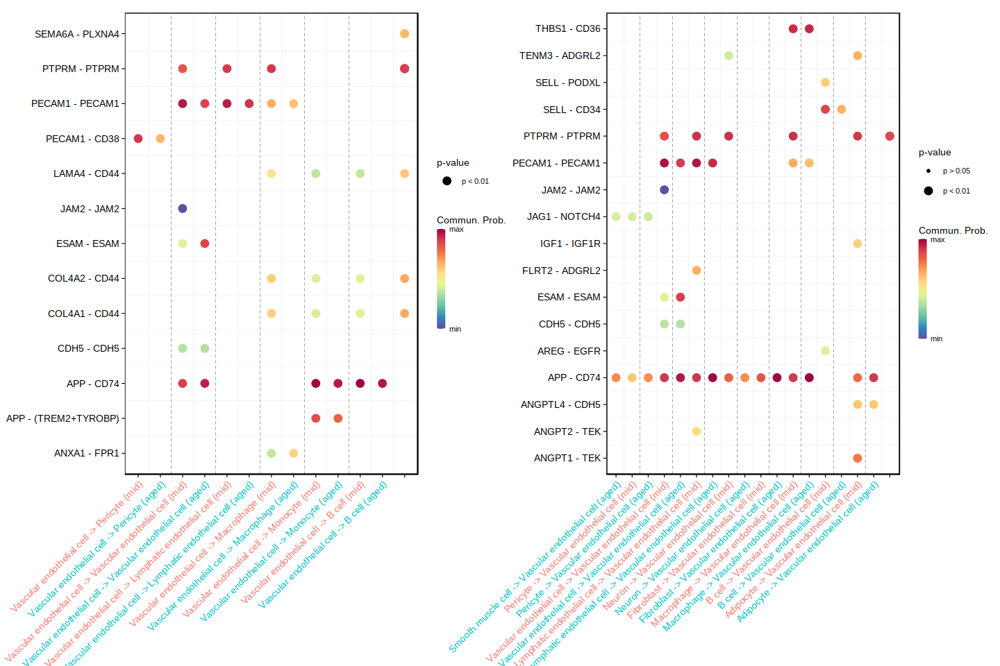

In [138]:
# vEC
options(repr.plot.width=12,repr.plot.height=8)
gg1 <- netVisual_bubble(cellchat, sources.use = c(4), comparison = c(2,3), angle.x = 45)
gg2 <- netVisual_bubble(cellchat, targets.use = c(4), comparison = c(2,3), angle.x = 45)
patchwork::wrap_plots(plots = list(gg1,gg2))

Comparing communications on a merged object 


Comparing communications on a merged object 




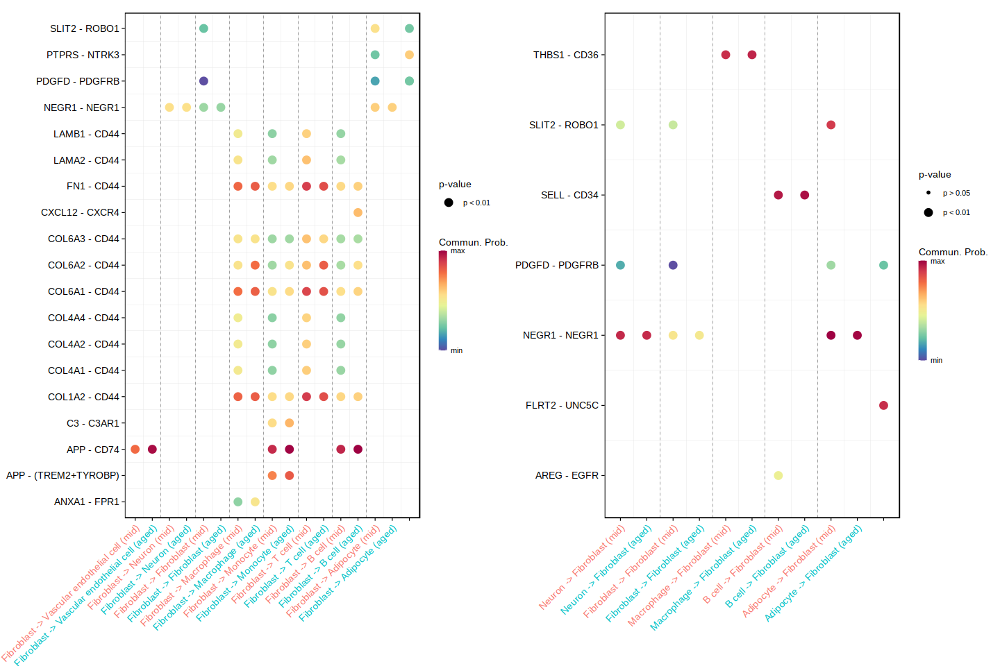

In [139]:
# FB
options(repr.plot.width=12,repr.plot.height=8)
gg1 <- netVisual_bubble(cellchat, sources.use = c(7), comparison = c(2,3), angle.x = 45)
gg2 <- netVisual_bubble(cellchat, targets.use = c(7), comparison = c(2,3), angle.x = 45)
patchwork::wrap_plots(plots = list(gg1,gg2))

Comparing communications on a merged object 


Comparing communications on a merged object 




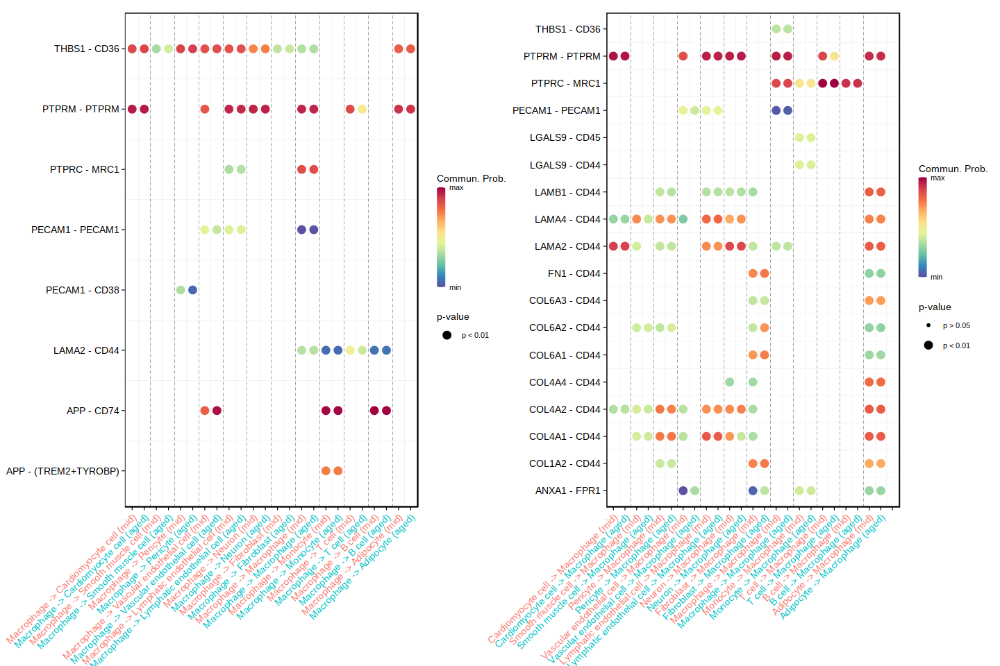

In [140]:
# MP
options(repr.plot.width=12,repr.plot.height=8)
gg1 <- netVisual_bubble(cellchat, sources.use = c(8), comparison = c(2,3), angle.x = 45)
gg2 <- netVisual_bubble(cellchat, targets.use = c(8), comparison = c(2,3), angle.x = 45)
patchwork::wrap_plots(plots = list(gg1,gg2))

Comparing communications on a merged object 


Comparing communications on a merged object 




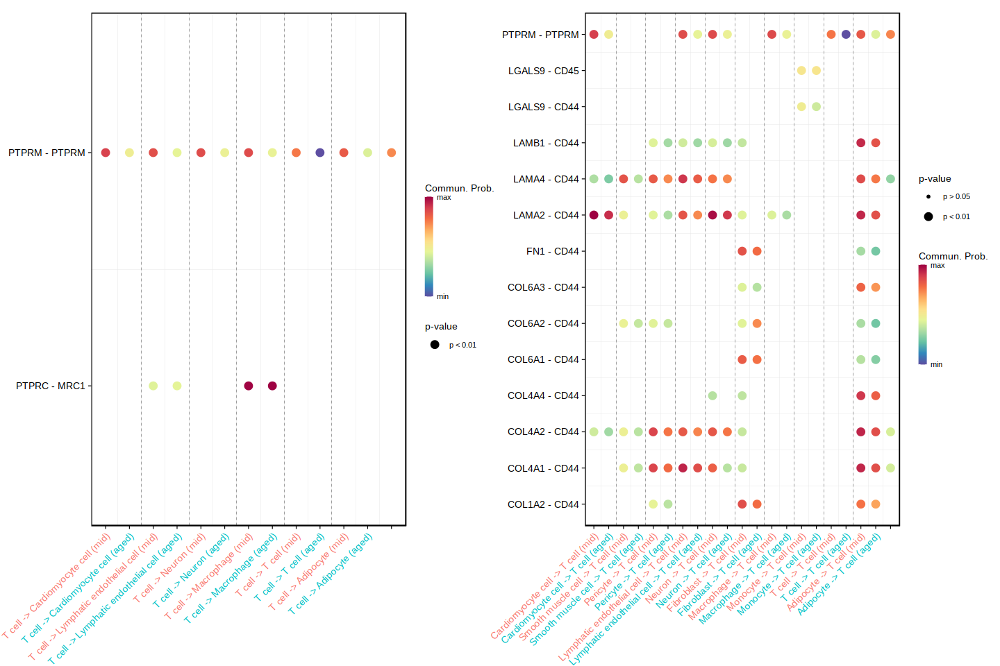

In [141]:
# T
options(repr.plot.width=12,repr.plot.height=8)
gg1 <- netVisual_bubble(cellchat, sources.use = c(10), comparison = c(2,3), angle.x = 45)
gg2 <- netVisual_bubble(cellchat, targets.use = c(10), comparison = c(2,3), angle.x = 45)
patchwork::wrap_plots(plots = list(gg1,gg2))